In [ ]:
"""
CS895_Computational_Imaging_Spring_2025__
|
DNA_DAMAGE_QUANTIFICATION (DDQ)
CS895_CI_ddq_custom_model_training.ipynb
Created on Tue Feb 25 18:23:59 2025
@authors: Rochana Obadage and Kumushini Thennakoon
|
Referenced from: https://colab.research.google.com/github/MouseLand/cellpose/blob/main/notebooks/run_cellpose_2.ipynb
"""


# cellpose 3.1

We will first install cellpose 3.1, check the GPU is working, and mount google drive to get your models and images.

## Installation

`Check CUDA version and that GPU is working in cellpose and import other libraries.`

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [1]:
# 2. Install compatible versions
!pip install numpy==1.26.4 opencv-python-headless==4.8.1.78 natsort matplotlib

# 3. Install Cellpose
!pip install cellpose


In [8]:
!pip uninstall cellpose-sam -y
!pip install cellpose==4.0.6



In [9]:
# !nvcc --version
!nvidia-smi

import os, shutil
import numpy as np
import matplotlib.pyplot as plt
from cellpose import core, utils, io, models, metrics
from glob import glob

from natsort import natsorted

# import matplotlib.pyplot as plt
# import numpy as np
# from skimage import io


use_GPU = core.use_gpu()
yn = ['NO', 'YES']
print(f'>>> GPU activated? {yn[use_GPU]}')

Thu Sep 25 01:35:00 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   46C    P0             26W /   70W |    2478MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [10]:


train_files = natsorted(glob('/content/drive/MyDrive/datasets/ground truths #711/tissue culture #35/Cellpose 3.1 model training data with instance masks/Train/*.tif'))
train_seg = natsorted(glob('/content/drive/MyDrive/datasets/ground truths #711/tissue culture #35/Cellpose 3.1 model training data with instance masks/Train/*.png'))

test_files = natsorted(glob('/content/drive/MyDrive/datasets/ground truths #711/tissue culture #35/Cellpose 3.1 model training data with instance masks/Test/*.tif'))
test_seg = natsorted(glob('/content/drive/MyDrive/datasets/ground truths #711/tissue culture #35/Cellpose 3.1 model training data with instance masks/Test/*.png'))

`what the training images look like + their labels`

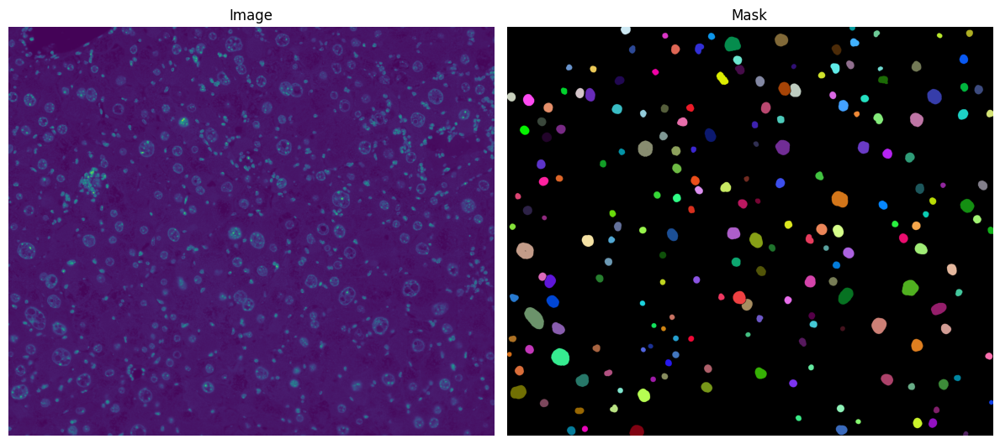

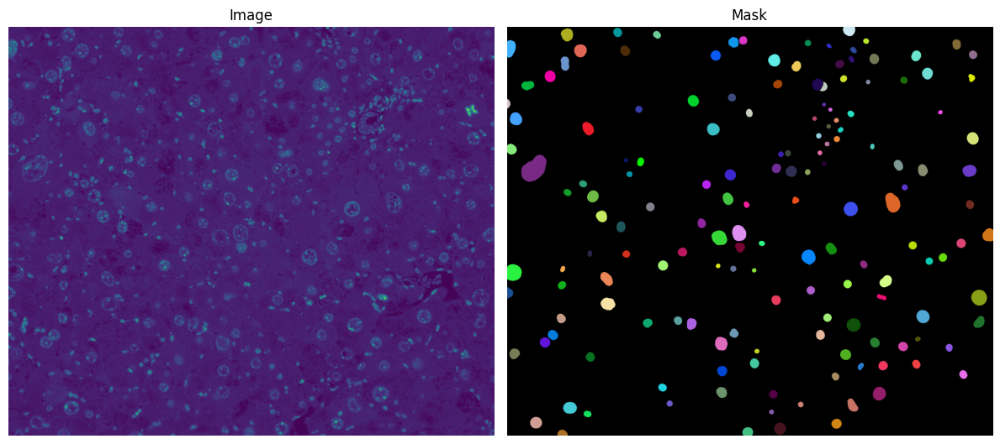

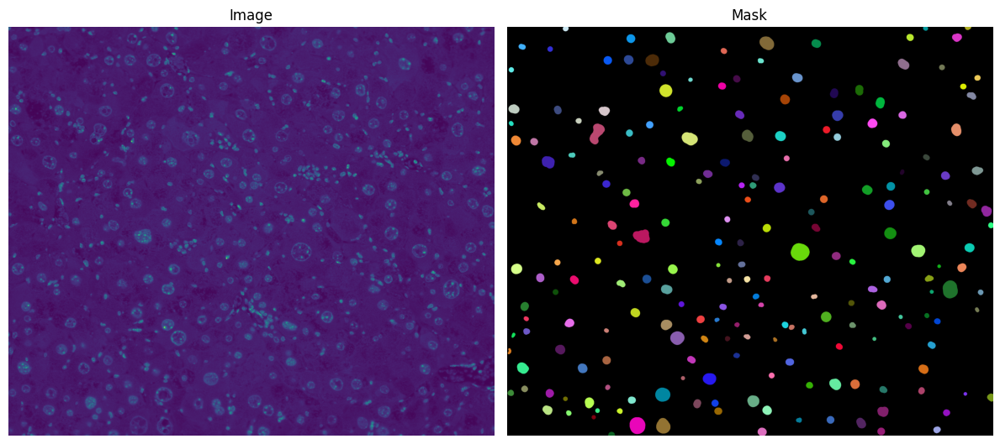

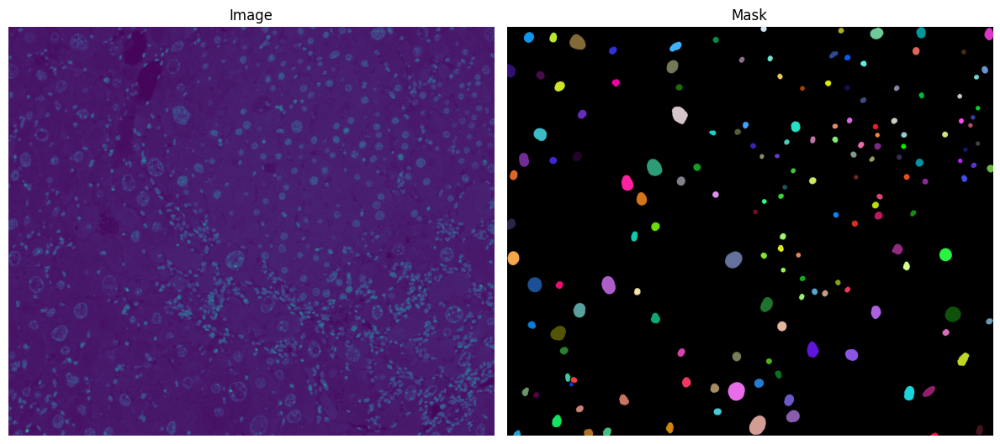

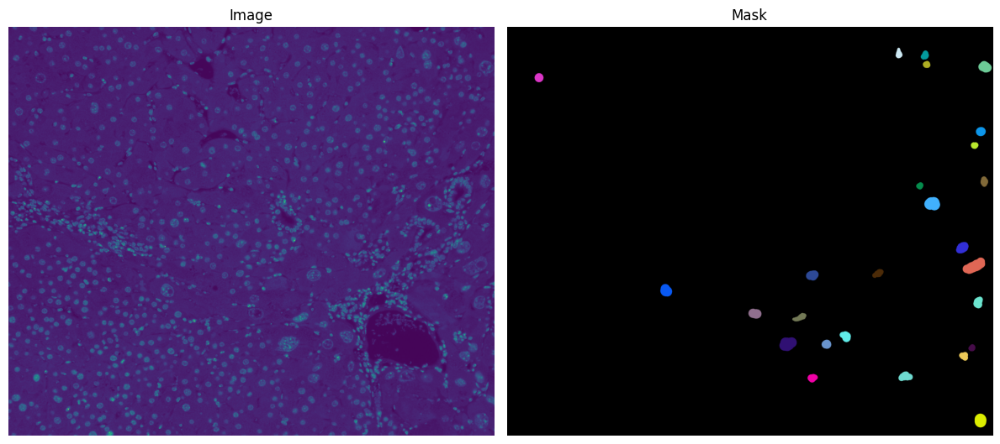

...

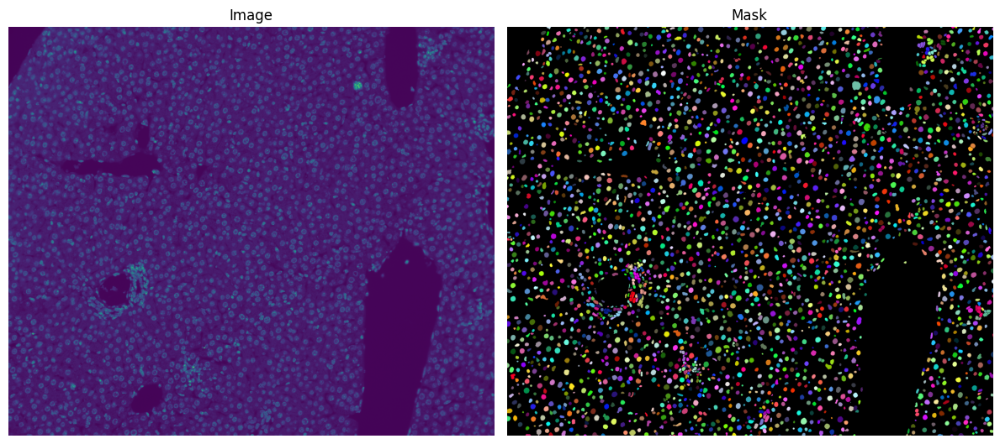

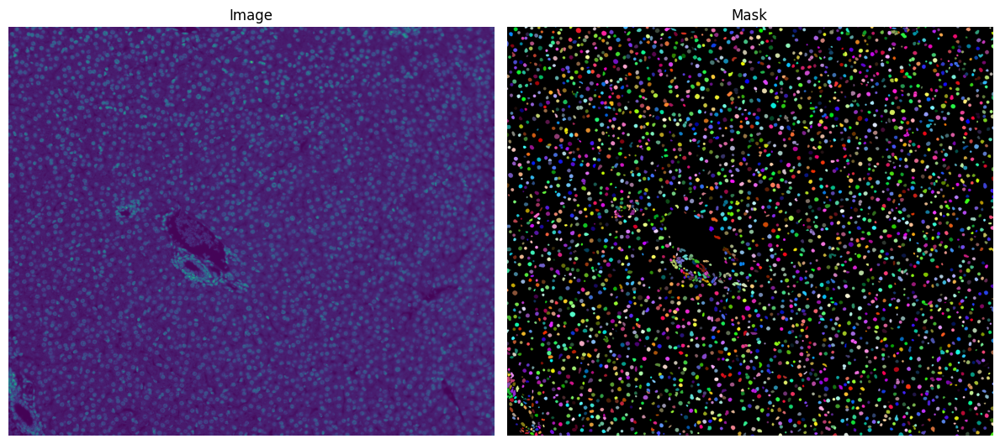

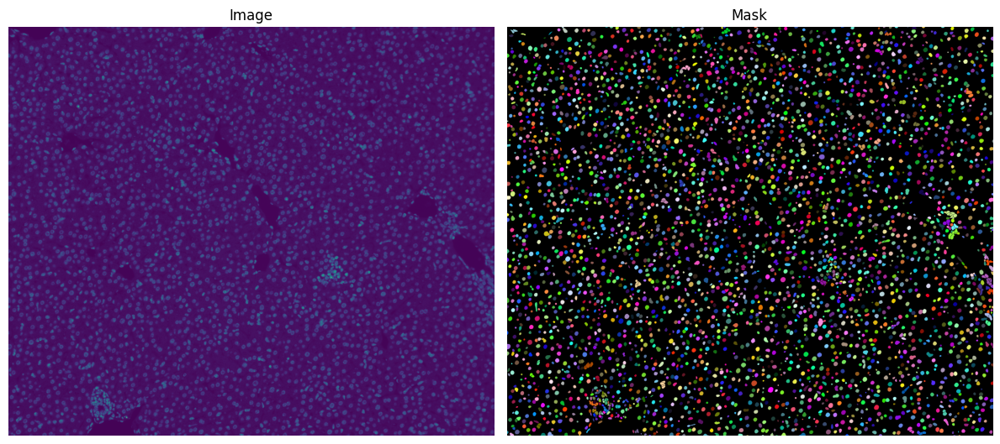

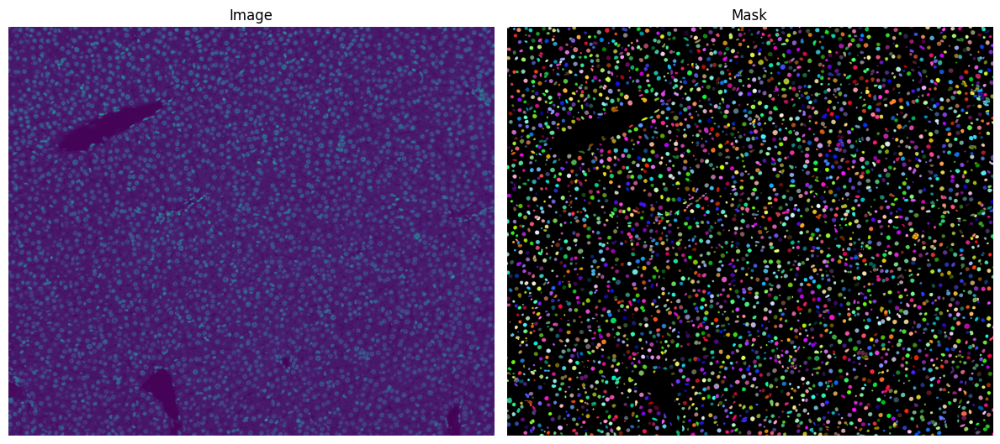

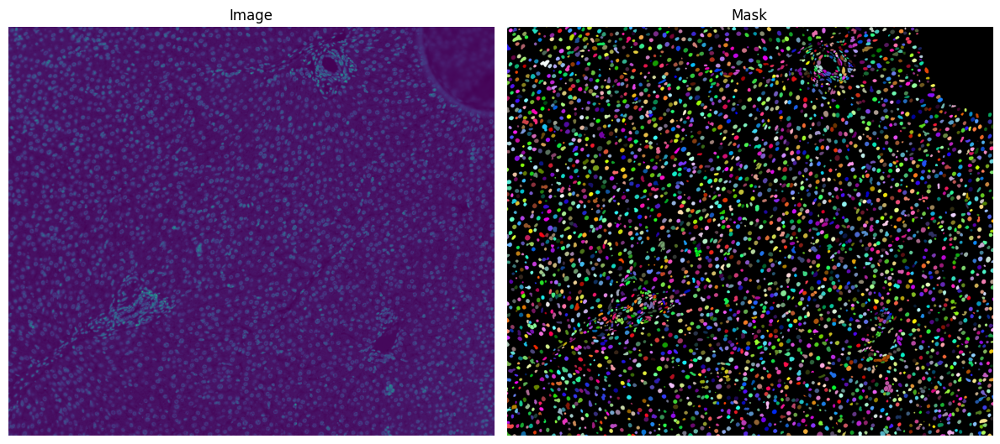

In [11]:
import matplotlib.pyplot as plt
from skimage import io
import numpy as np
import os

for k, f in enumerate(train_files):
    # Load the image
    img = io.imread(f)

    # Normalize image if needed
    if img.dtype != np.uint8:
        img = img.astype(np.float32)
        img /= img.max() if img.max() > 0 else 1  # scale to [0, 1]

    # Construct the mask file path by appending '_mask.png' to the image filename
    seg_path = os.path.splitext(f)[0] + '_mask.png'

    # Load the mask image
    seg = io.imread(seg_path)

    # If the mask is missing, create a blank mask (optional)
    if seg is None:
        print(f"Warning: Mask file not found for {f}")
        seg = np.zeros_like(img)  # Create a blank mask as a placeholder

    # Create a subplot with 1 row and 2 columns (for image and mask)
    plt.figure(figsize=(12, 6))  # Adjust figure size as needed

    # Plot the image on the left
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title("Image")

    plt.xlabel(os.path.basename(f))
    # Plot the mask on the right
    plt.subplot(1, 2, 2)
    plt.imshow(seg, cmap='nipy_spectral')  # Color-coded mask
    plt.axis('off')
    plt.title("Mask")

    # Show the plot
    plt.tight_layout()
    plt.show()


# Train model on manual annotations

## Training parameters

<font size = 2> **Paths for training, predictions and results**


<font size = 2>**`train_dir:`, `test_dir`:** These are the paths to your folders train_dir (with images and masks of training images) and test_dir (with images and masks of test images).

<font size = 2>**`initial_model`:** Choose a model from the cellpose [model zoo](https://cellpose.readthedocs.io/en/latest/models.html#model-zoo) to start from.

<font size = 2>**`model_name`**: Enter the path where your model will be saved once trained (for instance your result folder).

<font size = 2>**Training parameters**

<font size = 2>**`number_of_epochs`:** Input how many epochs the network will be trained. At least 100 epochs are recommended, but sometimes 250 epochs are necessary, particularly from scratch. **Default value: 100**



In [12]:
train_dir = "/content/drive/MyDrive/datasets/ground truths #711/tissue culture #35/Cellpose 3.1 model training data with instance masks/Train"
test_dir = "/content/drive/MyDrive/datasets/ground truths #711/tissue culture #35/Cellpose 3.1 model training data with instance masks/Test"

#Define where the patch file will be saved
base = "cellpose"

# model name and path
from cellpose import models
initial_model = "nuclei" # ["cyto", "cyto3","nuclei","tissuenet_cp3", "livecell_cp3", "yeast_PhC_cp3", "yeast_BF_cp3", "bact_phase_cp3", "bact_fluor_cp3", "deepbacs_cp3", "scratch"]
model_name = "ddq_model_1"

# other parameters for training.
n_epochs =  100
Channel_to_use_for_training = "Grayscale" # ["Grayscale", "Blue", "Green", "Red"]

# If you have a secondary channel that can be used for training, for instance nuclei, choose it here:
Second_training_channel= "None" #@param ["None", "Blue", "Green", "Red"]

# Advanced Parameters
Use_Default_Advanced_Parameters = True
learning_rate = 0.1
weight_decay = 0.0001

if (Use_Default_Advanced_Parameters):
  print("Default advanced parameters enabled")
  learning_rate = 0.1
  weight_decay = 0.0001

#here we check that no model with the same name already exist, if so delete
model_path = 'custom_models/'
if os.path.exists(model_path+'/'+model_name):
  print("!! WARNING: "+model_name+" already exists and will be deleted in the following cell !!")

if len(test_dir) == 0:
  test_dir = None

# Here we match the channel to number
if Channel_to_use_for_training == "Grayscale":
  chan = 0
elif Channel_to_use_for_training == "Blue":
  chan = 3
elif Channel_to_use_for_training == "Green":
  chan = 2
elif Channel_to_use_for_training == "Red":
  chan = 1


# Set chan2 to 0 since no second channel is required
chan2 = 0


if initial_model=='scratch':
  initial_model = 'None'

Default advanced parameters enabled


Here's what the command to train would be on the command line -- make sure if you run this locally to correct the paths for your local computer.

In [ ]:
run_str = f'python -m cellpose --use_gpu --verbose --train --dir {train_dir} --pretrained_model {initial_model} --chan {chan} --chan2 {chan2} --n_epochs {n_epochs} --learning_rate {learning_rate} --weight_decay {weight_decay}'
if test_dir is not None:
    run_str += f' --test_dir {test_dir}'
run_str += ' --mask_filter _seg.npy' # if you want to use _seg.npy files for training
print(run_str)

python -m cellpose --use_gpu --verbose --train --dir dataset/train --pretrained_model nuclei --chan 1 --chan2 0 --n_epochs 100 --learning_rate 0.1 --weight_decay 0.0001 --test_dir dataset/test --mask_filter _seg.npy


## Train new model

Using settings from form above, train model in notebook.

In [18]:
from cellpose import io, models, train
import os
from skimage.io import imread

# Prepare image and mask paths
train_image_paths = sorted([os.path.join(train_dir, f) for f in os.listdir(train_dir) if f.endswith('.tif')])
train_mask_paths  = sorted([os.path.join(train_dir, f) for f in os.listdir(train_dir) if f.endswith('_mask.png')])

# Load images
train_data = [imread(f) for f in train_image_paths]

# Load masks (ensure 2D if mask is RGB)
train_labels = []
for f in train_mask_paths:
    mask = imread(f)
    if mask.ndim == 3:
        mask = mask[..., 0]  # take first channel
    train_labels.append(mask)


model_path = 'custom_models/'
os.makedirs(model_path, exist_ok=True)

# Initialize model
model = models.CellposeModel(gpu=use_GPU, model_type='nuclei')  # model_type ignored, fine

# Train without 'channels' argument
new_model_path, train_losses, test_losses = train.train_seg(
    model.net,
    train_data=train_data,
    train_labels=train_labels,
    n_epochs=n_epochs,
    learning_rate=learning_rate,
    weight_decay=weight_decay,
    SGD=True,
    nimg_per_epoch=8,
    model_name=model_name,
    save_path=model_path
)

# diameter of labels
diam_labels = model.net.diam_labels.item()


2025-09-25 01:54:51,268 [WARNING] model_type argument is not used in v4.0.1+. Ignoring this argument...
2025-09-25 01:54:51,269 [INFO] ** TORCH CUDA version installed and working. **
2025-09-25 01:54:51,270 [INFO] >>>> using GPU (CUDA)
2025-09-25 01:54:53,399 [INFO] >>>> loading model /root/.cellpose/models/cpsam
2025-09-25 01:54:54,014 [WARNING] SGD is deprecated, using AdamW instead
2025-09-25 01:54:54,015 [INFO] computing flows for labels


100%|██████████| 16/16 [04:24<00:00, 16.51s/it]

2025-09-25 01:59:18,395 [INFO] >>> computing diameters



100%|██████████| 16/16 [00:00<00:00, 54.31it/s]

2025-09-25 01:59:18,693 [INFO] >>> normalizing {'lowhigh': None, 'percentile': None, 'normalize': True, 'norm3D': True, 'sharpen_radius': 0, 'smooth_radius': 0, 'tile_norm_blocksize': 0, 'tile_norm_smooth3D': 1, 'invert': False}


2025-09-25 01:59:21,029 [INFO] >>> n_epochs=100, n_train=16, n_test=None
2025-09-25 01:59:21,031 [INFO] >>> AdamW, learning_rate=0.10000, weight_decay=0.00010
2025-09-25 01:59:21,034 [INFO] >>> saving model to custom_models/models/ddq_model_1
2025-09-25 01:59:30,700 [INFO] 0, train_loss=0.8263, test_loss=0.0000, LR=0.000000, time 9.67s
2025-09-25 02:00:12,080 [INFO] 5, train_loss=0.8451, test_loss=0.0000, LR=0.055556, time 51.05s
2025-09-25 02:00:53,905 [INFO] 10, train_loss=0.5341, test_loss=0.0000, LR=0.100000, time 92.87s
2025-09-25 02:02:17,243 [INFO] 20, train_loss=0.6113, test_loss=0.0000, LR=0.100000, time 176.21s
2025-09-25 02:03:41,112 [INFO] 30, train_loss=0.6035, test_loss=0.0000, LR=0.100000, time 260.08s
2025-09-25 02:05:04,982 [INFO] 40, train_loss=0.5814, test_loss=0.0000, LR=0.100000, time 343.95s
2025-09-25 02:06:28,995 [INFO] 50, train_loss=0.5904, test_loss=0.0000, LR=0.050000, time 427.96s
2025-09-25 02:07:52,971 [INFO] 60, train_loss=0.5163, test_loss=0.0000, LR=0.

In [14]:
import os

print("Train images:")
print(sorted([f for f in os.listdir(train_dir) if f.endswith('.tif')]))

print("Masks:")
print(sorted([f for f in os.listdir(train_dir) if f.endswith('_mask.png')]))


Train images:
['153.RGM.M.2NDMA.50Days.Liver.yH2AX.Ki67.20x.1-008.tif', '153.RGM.M.2NDMA.50Days.Liver.yH2AX.Ki67.20x.2-005.tif', '153.RGM.M.2NDMA.50Days.Liver.yH2AX.Ki67.20x.3-004.tif', '155.RGM.M.2NDMA.10Wks.Liver.yH2AX.Ki67.20x.1-009.tif', '155.RGM.M.2NDMA.10Wks.Liver.yH2AX.Ki67.20x.2-003.tif', '74.RGM.M.2NDMA.30Days.Liver.yH2AX.Ki67.20x.1-001.tif', '74.RGM.M.2NDMA.30Days.Liver.yH2AX.Ki67.20x.3-006.tif', '74.RGM.M.2NDMA.30Days.Liver.yH2AX.Ki67.20x.4-007.tif', 'Copy of original_10.tif', 'Copy of original_11.tif', 'Copy of original_4.tif', 'Copy of original_5.tif', 'Copy of original_6.tif', 'Copy of original_7.tif', 'Copy of original_8.tif', 'Copy of original_9.tif']
Masks:
['153.RGM.M.2NDMA.50Days.Liver.yH2AX.Ki67.20x.1-008_mask.png', '153.RGM.M.2NDMA.50Days.Liver.yH2AX.Ki67.20x.2-005_mask.png', '153.RGM.M.2NDMA.50Days.Liver.yH2AX.Ki67.20x.3-004_mask.png', '155.RGM.M.2NDMA.10Wks.Liver.yH2AX.Ki67.20x.1-009_mask.png', '155.RGM.M.2NDMA.10Wks.Liver.yH2AX.Ki67.20x.2-003_mask.png', '74.RGM.

2025-09-25 02:35:00,817 [INFO] 0%|          | 0/5 [00:00<?, ?it/s]
2025-09-25 02:35:15,051 [INFO] No cell pixels found.
2025-09-25 02:35:15,054 [WARNING] Resizing is depricated in v4.0.1+
2025-09-25 02:35:30,458 [INFO] No cell pixels found.
2025-09-25 02:35:30,461 [WARNING] Resizing is depricated in v4.0.1+
2025-09-25 02:35:31,205 [INFO] 40%|####      | 2/5 [00:30<00:45, 15.19s/it]
2025-09-25 02:35:45,549 [INFO] No cell pixels found.
2025-09-25 02:35:45,552 [WARNING] Resizing is depricated in v4.0.1+
2025-09-25 02:35:46,298 [INFO] 40%|####      | 2/5 [00:45<00:45, 15.19s/it]
2025-09-25 02:36:00,107 [INFO] No cell pixels found.
2025-09-25 02:36:00,109 [WARNING] Resizing is depricated in v4.0.1+
2025-09-25 02:36:14,598 [INFO] No cell pixels found.
2025-09-25 02:36:14,601 [WARNING] Resizing is depricated in v4.0.1+
2025-09-25 02:36:15,140 [INFO] 100%|##########| 5/5 [01:14<00:00, 14.86s/it]


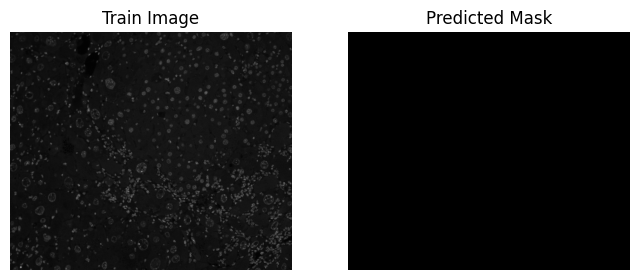

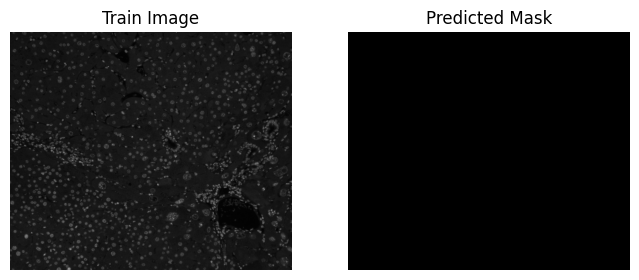

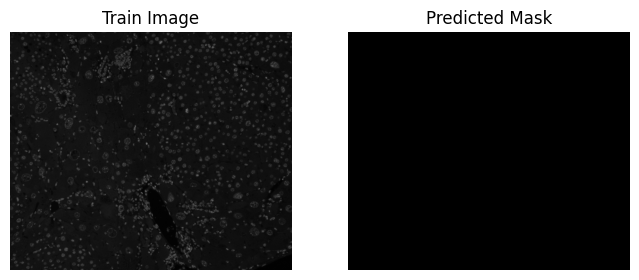

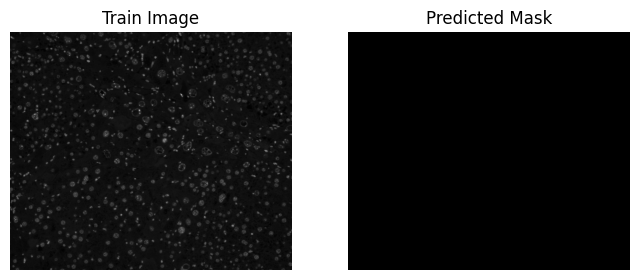

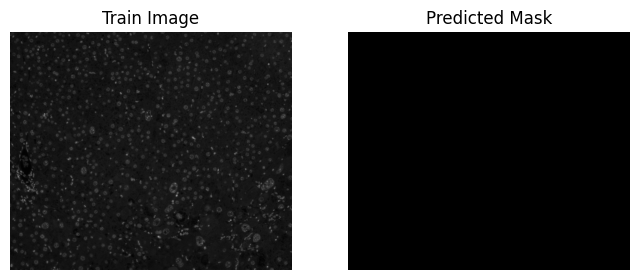

In [28]:
masks_train = model.eval(train_data[:5], diameter=diam_labels)[0]
import matplotlib.pyplot as plt

for i in range(5):
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.imshow(train_data[i], cmap='gray')
    plt.title("Train Image")
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(masks_train[i], cmap='nipy_spectral')
    plt.title("Predicted Mask")
    plt.axis('off')
    plt.show()


## Evaluate on test data (optional)

If you have test data, check performance

2025-09-25 02:32:59,327 [INFO] ** TORCH CUDA version installed and working. **
2025-09-25 02:32:59,328 [INFO] >>>> using GPU (CUDA)
2025-09-25 02:33:02,465 [INFO] >>>> loading model custom_models/models/ddq_model_1
2025-09-25 02:33:02,859 [INFO] 0%|          | 0/5 [00:00<?, ?it/s]
2025-09-25 02:33:17,371 [INFO] No cell pixels found.
2025-09-25 02:33:17,374 [WARNING] Resizing is depricated in v4.0.1+
2025-09-25 02:33:32,544 [INFO] No cell pixels found.
2025-09-25 02:33:32,546 [WARNING] Resizing is depricated in v4.0.1+
2025-09-25 02:33:33,104 [INFO] 40%|####      | 2/5 [00:30<00:45, 15.12s/it]
2025-09-25 02:33:37,170 [INFO] No cell pixels found.
2025-09-25 02:33:37,171 [WARNING] Resizing is depricated in v4.0.1+
2025-09-25 02:33:41,393 [INFO] No cell pixels found.
2025-09-25 02:33:41,395 [WARNING] Resizing is depricated in v4.0.1+
2025-09-25 02:33:45,562 [INFO] No cell pixels found.
2025-09-25 02:33:45,564 [WARNING] Resizing is depricated in v4.0.1+
2025-09-25 02:33:45,698 [INFO] 100%|#

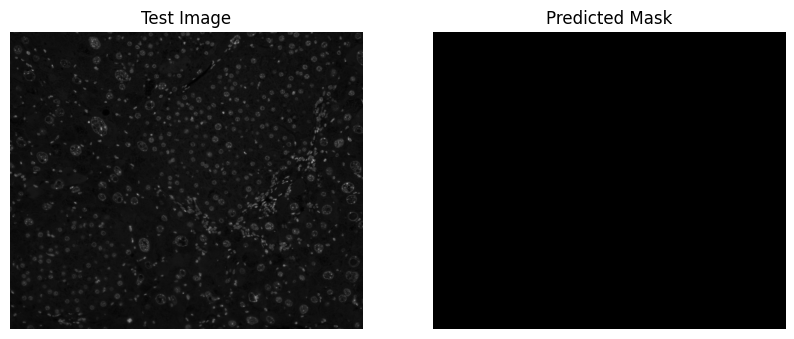


>>> Average precision at IoU threshold 0.5 = 0.000


In [27]:
from skimage.io import imread
import os
from cellpose import metrics, models
import matplotlib.pyplot as plt

# --- Directories ---
test_dir = "/content/drive/MyDrive/datasets/ground truths #711/tissue culture #35/Cellpose 3.1 model training data with instance masks/Test"
trained_model_path = "custom_models/models/ddq_model_1"  # full path including 'models/'

# --- Prepare test image and mask paths ---
test_image_paths = sorted([os.path.join(test_dir, f) for f in os.listdir(test_dir) if f.endswith('.tif')])
test_mask_paths  = sorted([os.path.join(test_dir, f) for f in os.listdir(test_dir) if f.endswith('_mask.png')])

# --- Load test images exactly like training (raw) ---
test_data = [imread(f) for f in test_image_paths]

# --- Ensure test images are 2D (grayscale) ---
for i in range(len(test_data)):
    if test_data[i].ndim == 3:
        test_data[i] = test_data[i][..., 0]  # take first channel

# --- Load test masks (2D) ---
test_labels = []
for f in test_mask_paths:
    mask = imread(f)
    if mask.ndim == 3:
        mask = mask[..., 0]
    test_labels.append(mask)

# --- Initialize your trained model ---
trained_model = models.CellposeModel(gpu=True, pretrained_model=trained_model_path)

# --- Run inference ---
# Use the diameter from training (diam_labels) or set manually if needed
masks = trained_model.eval(test_data, diameter=diam_labels)[0]

# --- Optional: visualize first prediction ---
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(test_data[0], cmap='gray')
plt.title("Test Image")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(masks[0], cmap='nipy_spectral')
plt.title("Predicted Mask")
plt.axis('off')
plt.show()

# --- Evaluate performance using ground-truth masks ---
ap = metrics.average_precision(test_labels, masks)[0]
print('')
print(f'>>> Average precision at IoU threshold 0.5 = {ap[:,0].mean():.3f}')


plot masks

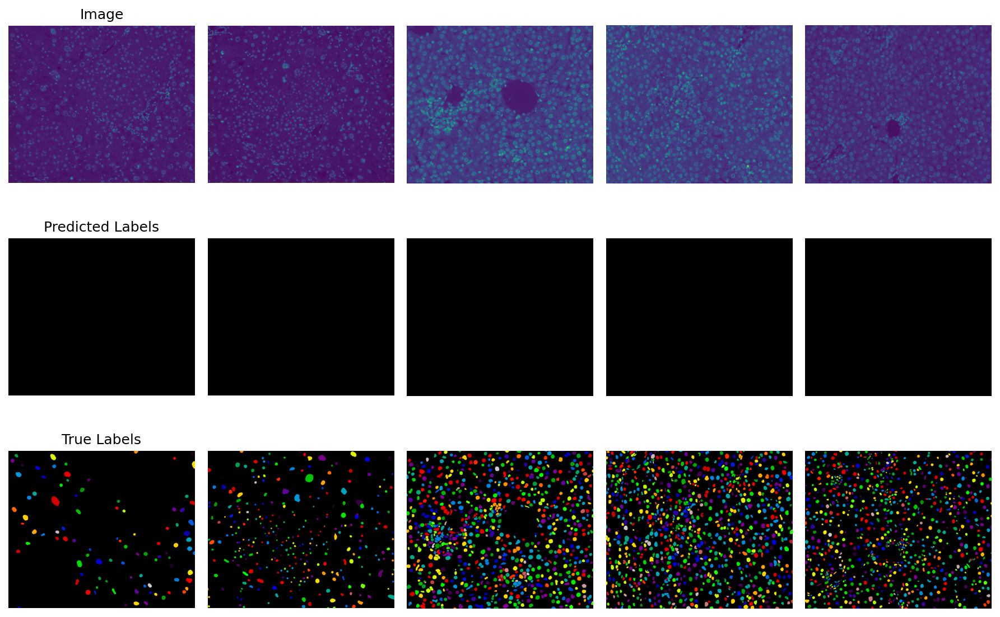

In [26]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(12, 8), dpi=150)

for k, im in enumerate(test_data):
    # Copy image and normalize if needed
    img = im.copy()
    if img.dtype != np.uint8:
        img = img.astype(np.float32)
        img /= img.max() if img.max() > 0 else 1  # Normalize to [0,1]

    # Optional padding (can remove if unnecessary)
    img = np.vstack((img, np.zeros_like(img)[:1]))

    # Transpose if in (C, H, W) format
    if img.ndim == 3 and img.shape[0] <= 4:
        img = img.transpose(1, 2, 0)

    # Plot original image
    plt.subplot(3, len(test_data), k + 1)
    plt.imshow(img)
    plt.axis('off')
    if k == 0:
        plt.title('Image')

    # Plot predicted mask
    plt.subplot(3, len(test_data), len(test_data) + k + 1)
    plt.imshow(masks[k], cmap='nipy_spectral')
    plt.axis('off')
    if k == 0:
        plt.title('Predicted Labels')

    # Plot ground truth
    plt.subplot(3, len(test_data), 2 * len(test_data) + k + 1)
    plt.imshow(test_labels[k], cmap='nipy_spectral')
    plt.axis('off')
    if k == 0:
        plt.title('True Labels')

plt.tight_layout()
plt.show()


# Use custom model to segment images

In [ ]:
model_path = "custom_models/models/ddq_model_1"
image_dir = "dataset/create_new_labels"

# Channel Parameters:

Channel_to_use_for_segmentation = "Red" # ["Grayscale", "Blue", "Green", "Red"]
Second_segmentation_channel= "None" # ["None", "Blue", "Green", "Red"]

# Here we match the channel to number
if Channel_to_use_for_segmentation == "Grayscale":
  chan = 0
elif Channel_to_use_for_segmentation == "Blue":
  chan = 3
elif Channel_to_use_for_segmentation == "Green":
  chan = 2
elif Channel_to_use_for_segmentation == "Red":
  chan = 1

if Second_segmentation_channel == "Blue":
  chan2 = 3
elif Second_segmentation_channel == "Green":
  chan2 = 2
elif Second_segmentation_channel == "Red":
  chan2 = 1
elif Second_segmentation_channel == "None":
  chan2 = 0

# Segmentation parameters:
# diameter of cells (set to zero to use diameter from training set):
diameter =  0 # {type:"number"}

# threshold on flow error to accept a mask (set higher to get more cells, e.g. in range from (0.1, 3.0), OR set to 0.0 to turn off so no cells discarded):
flow_threshold = 0.4 # {type:"slider", min:0.0, max:3.0, step:0.1}

# threshold on cellprob output to seed cell masks (set lower to include more pixels or higher to include fewer, e.g. in range from (-6, 6)):
cellprob_threshold=0 # {type:"slider", min:-6, max:6, step:1}

In [ ]:
run_str = f'python -m cellpose --use_gpu --verbose --dir {image_dir} --pretrained_model {model_path} --chan {chan} --chan2 {chan2} --diameter {diameter} --flow_threshold {flow_threshold} --cellprob_threshold {cellprob_threshold}'
print(run_str)

python -m cellpose --use_gpu --verbose --dir dataset/create_new_labels --pretrained_model custom_models/models/ddq_model_1 --chan 1 --chan2 0 --diameter 0 --flow_threshold 0.4 --cellprob_threshold 0


## run custom model

In [ ]:
# gets image files in dir (ignoring image files ending in _masks)
files = io.get_image_files(image_dir, '_masks')
print(files)
images = [io.imread(f) for f in files]

# declare model
model = models.CellposeModel(gpu=True,
                             pretrained_model=model_path)

# use model diameter if user diameter is 0
diameter = model.diam_labels if diameter==0 else diameter

# run model on test images
masks, flows, styles = model.eval(images,
                                  channels=[chan, chan2],
                                  diameter=diameter,
                                  flow_threshold=flow_threshold,
                                  cellprob_threshold=cellprob_threshold
                                  )

['dataset/create_new_labels/4Gy_53BP1_8Hr.tif', 'dataset/create_new_labels/4Gy_gH2AX_8Hr.tif', 'dataset/create_new_labels/8Gy_53BP1_8Hr.tif', 'dataset/create_new_labels/8Gy_gH2AX_8Hr.tif']
2025-04-12 00:44:01,119 [INFO] ** TORCH CUDA version installed and working. **
2025-04-12 00:44:01,121 [INFO] >>>> using GPU (CUDA)
2025-04-12 00:44:01,234 [INFO] >>>> loading model custom_models/models/ddq_model_1
2025-04-12 00:44:01,366 [INFO] >>>> model diam_mean =  17.000 (ROIs rescaled to this size during training)
2025-04-12 00:44:01,368 [INFO] >>>> model diam_labels =  85.024 (mean diameter of training ROIs)
2025-04-12 00:44:12,931 [INFO] 100%|##########| 4/4 [00:11<00:00,  2.89s/it]


## save output to *_seg.npy

you will see the files save in the Files tab and you can download them from there

In [ ]:
from cellpose import io

io.masks_flows_to_seg(images,
                      masks,
                      flows,
                      files,
                      channels=[chan, chan2],
                      diams=diameter*np.ones(len(masks)),
                      )

## save output masks to tiffs/pngs or txt files for imageJ

In [ ]:
io.save_masks(images,
              masks,
              flows,
              files,
              channels=[chan, chan2],
              png=True, # save masks as PNGs and save example image
              tif=True, # save masks as TIFFs
              save_txt=True, # save txt outlines for ImageJ
              save_flows=False, # save flows as TIFFs
              save_outlines=False, # save outlines as TIFFs
              save_mpl=True # make matplotlib fig to view (WARNING: SLOW W/ LARGE IMAGES)
              )

In [ ]:
files[3]

'dataset/create_new_labels/8Gy_gH2AX_8Hr.tif'

(-0.5, 3599.5, 899.5, -0.5)

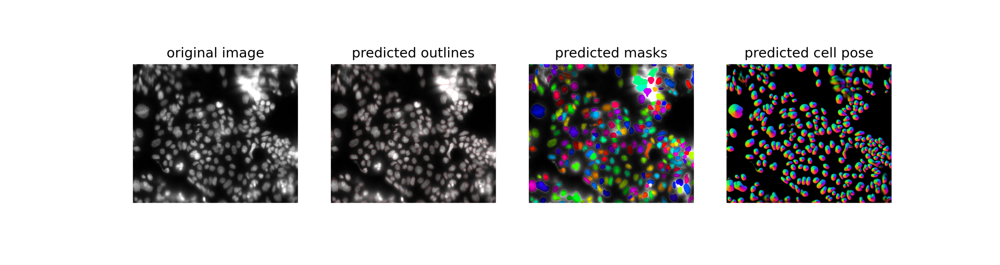

In [ ]:
f = files[0]
plt.figure(figsize=(12,4), dpi=300)
plt.imshow(io.imread(os.path.splitext(f)[0] + '_cp_output_cp_masks.png'))
plt.axis('off')

## .npy visualization

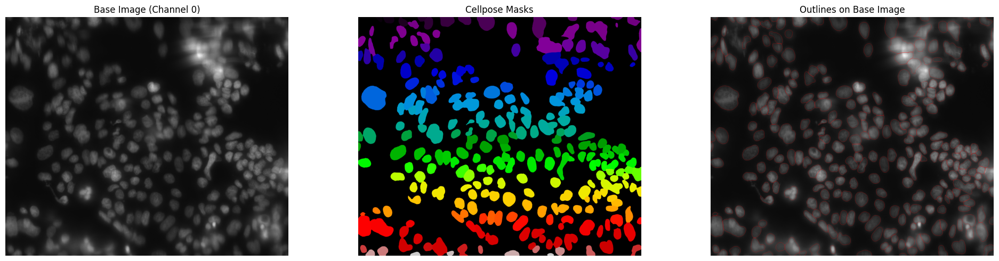

In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imsave
from skimage.segmentation import find_boundaries
from cellpose import plot

# Load TIFF image
img_name = 'dataset/create_new_labels/4Gy_53BP1_8Hr'
img = imread(f'{img_name}.tif')

# Handle (C, H, W) TIFFs
if img.ndim == 3 and img.shape[0] <= 4:
    img = np.moveaxis(img, 0, -1)

# At this point img shape = (H, W, 2)
H, W, C = img.shape
assert C == 2, f"Expected 2 channels, got {C}"

# Use first channel (e.g., blue = nuclei) as grayscale base for visualization
base_img = img[..., 0]  # or img[..., 1] if you prefer green

# Normalize if needed
if base_img.max() > 255:
    base_img = (base_img / base_img.max() * 255).astype(np.uint8)
else:
    base_img = base_img.astype(np.uint8)

# Convert to RGB (grayscale stacked 3 times)
img_rgb = np.stack([base_img] * 3, axis=-1)  # shape (H, W, 3)

# Load Cellpose outputs
seg_data = np.load(f'{img_name}_seg.npy', allow_pickle=True).item()
masks = seg_data['masks']
flows = seg_data['flows']
# flow_y, flow_x = flows[:2]

# Generate boundaries (outlines)
outlines = find_boundaries(masks, mode='inner')  # Generates boolean mask of boundaries

# Draw red outlines on the image
img_outline = img_rgb.copy()
img_outline[outlines] = np.array([255, 0, 0], dtype=np.uint8)  # Red color for outlines

# Plotting the results
fig, axs = plt.subplots(1, 3, figsize=(20, 5))

# Plot the original base image
axs[0].imshow(img_rgb)
axs[0].set_title("Base Image (Channel 0)")
axs[0].axis('off')

# Plot the Cellpose masks
axs[1].imshow(masks, cmap='nipy_spectral')
axs[1].set_title("Cellpose Masks")
axs[1].axis('off')

# Plot the outlines on the original image
imsave(f'{img_name}_outline.png',img_outline)
axs[2].imshow(img_outline)
axs[2].set_title("Outlines on Base Image")
axs[2].axis('off')


plt.tight_layout()
plt.show()
